In [27]:
import pandas as pd

df = pd.read_csv('cleaned_data.csv')
df.head()

,participant_id,day,PSS_score,Openness,Conscientiousness,Extraversion,Agreeableness,Neuroticism,sleep_time,wake_time,sleep_duration,PSQI_score,call_duration,num_calls,num_sms,screen_on_time,skin_conductance,accelerometer,mobility_radius,mobility_distance
0,1,1,34,2.322732,4.332193,1.185878,1.570213,3.782094,22.618591,5.190660,6.572069,1,3.924527,12,32,10.703714,3.115730,0.161717,1.145179,2.196851
1,1,2,37,1.761436,3.254120,3.907281,4.072512,1.997145,22.140549,6.170717,8.030168,4,58.318004,3,41,11.012939,0.959144,0.985587,1.021133,0.737825
2,1,3,30,3.025887,1.855002,2.045900,2.317493,3.619225,22.216405,5.318825,7.102420,1,4.941043,4,48,4.877372,3.311629,1.877445,0.478179,0.911673
3,1,4,16,1.948370,4.966676,3.345225,1.607756,3.583524,23.937781,8.061075,8.123294,3,0.295373,11,38,3.462956,0.625721,0.494921,0.630549,3.911418
4,1,5,32,3.343484,2.065936,3.137843,2.118061,2.567347,23.527002,7.312145,7.785143,3,22.300571,17,17,4.861046,0.622609,1.342600,0.254090,1.605132


       participant_id          day    PSS_score     Openness  \
count     3000.000000  3000.000000  3000.000000  3000.000000   
mean        50.500000    15.500000    24.701000     3.020663   
std         28.870882     8.656884     8.615781     1.159310   
min          1.000000     1.000000    10.000000     1.005003   
25%         25.750000     8.000000    17.000000     2.024510   
50%         50.500000    15.500000    25.000000     3.050115   
75%         75.250000    23.000000    32.000000     4.029171   
max        100.000000    30.000000    39.000000     4.997405   

       Conscientiousness  Extraversion  Agreeableness  Neuroticism  \
count        3000.000000   3000.000000    3000.000000  3000.000000   
mean            3.007883      3.002101       3.047659     2.963589   
std             1.140511      1.143507       1.161074     1.158624   
min             1.000982      1.000584       1.002206     1.000173   
25%             2.055579      2.018888       2.043813     1.974606   
50%

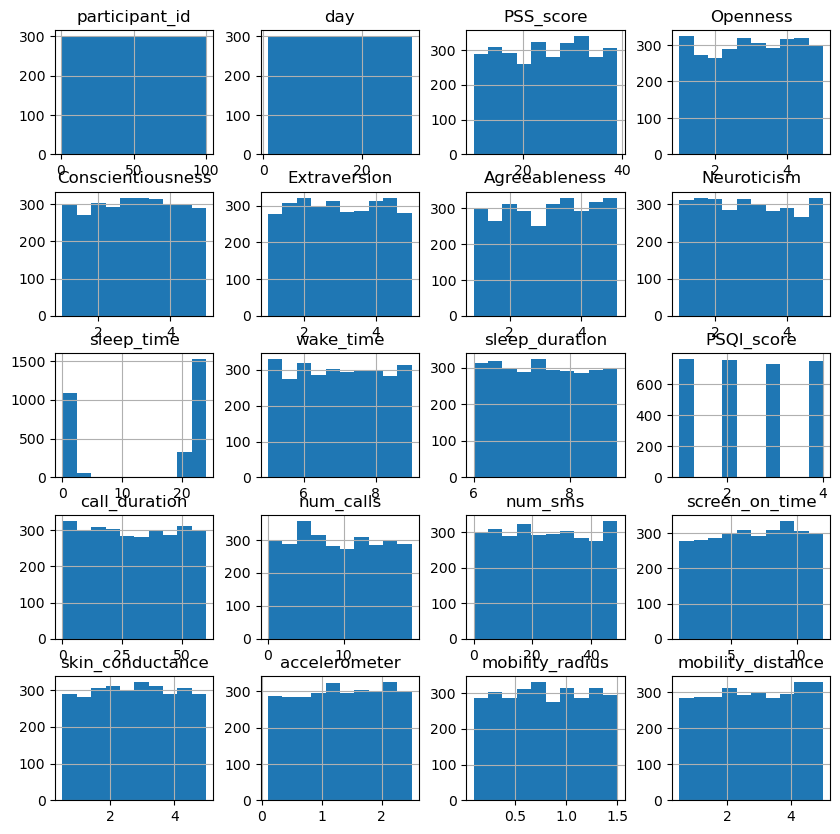

In [53]:
print(df.describe())

# Histograms of numerical columns
import matplotlib.pyplot as plt
df.hist(figsize=(10, 10))
plt.show()

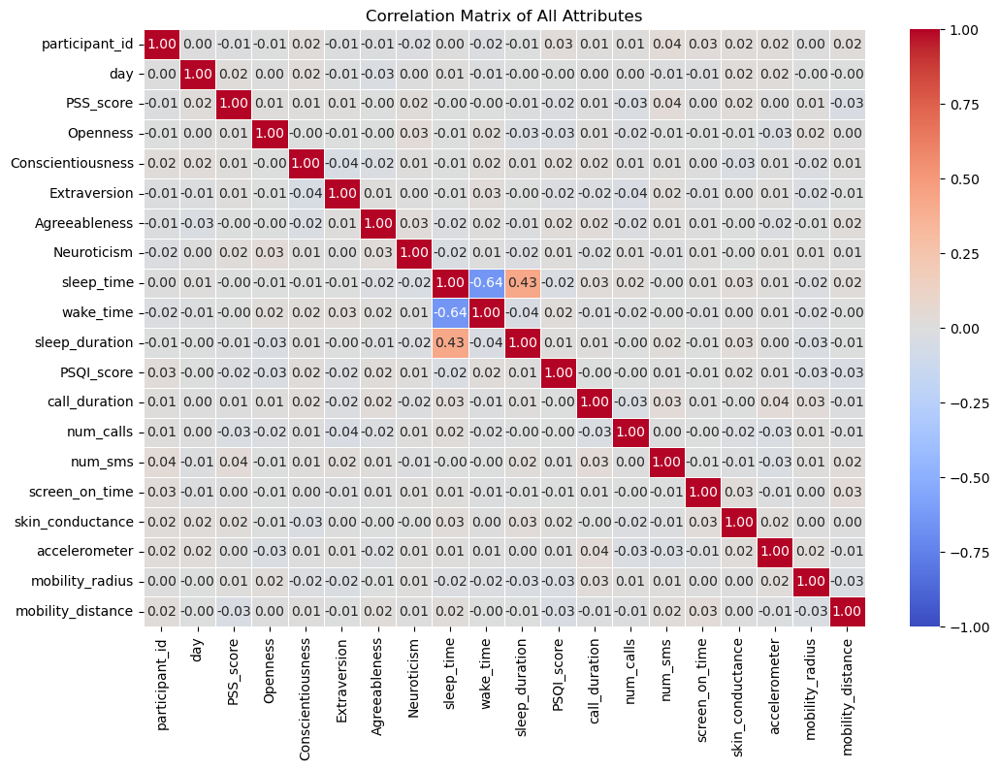

Correlations with PSS_score:
 PSS_score            1.000000
num_sms              0.035045
day                  0.022056
skin_conductance     0.016004
Neuroticism          0.015813
Conscientiousness    0.011215
Extraversion         0.010655
mobility_radius      0.008731
Openness             0.007923
call_duration        0.006049
accelerometer        0.004656
screen_on_time       0.004377
Agreeableness       -0.003250
sleep_time          -0.004866
wake_time           -0.004925
participant_id      -0.012926
sleep_duration      -0.014899
PSQI_score          -0.021299
num_calls           -0.028919
mobility_distance   -0.034954
Name: PSS_score, dtype: float64


In [31]:
#1. Overall Correlation Matrix
# Calculate the correlation matrix for the entire dataset
overall_corr = df.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))  # Set the size of the plot
sns.heatmap(overall_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, vmin=-1, vmax=1)

# Title and labels
plt.title('Correlation Matrix of All Attributes')
plt.show()

# Sort correlations with the target variable
target_corr = corr_matrix['PSS_score'].sort_values(ascending=False)
print("Correlations with PSS_score:\n", target_corr)

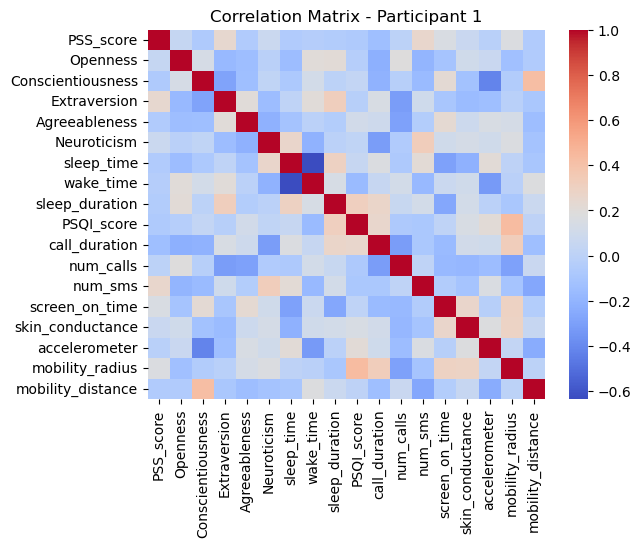

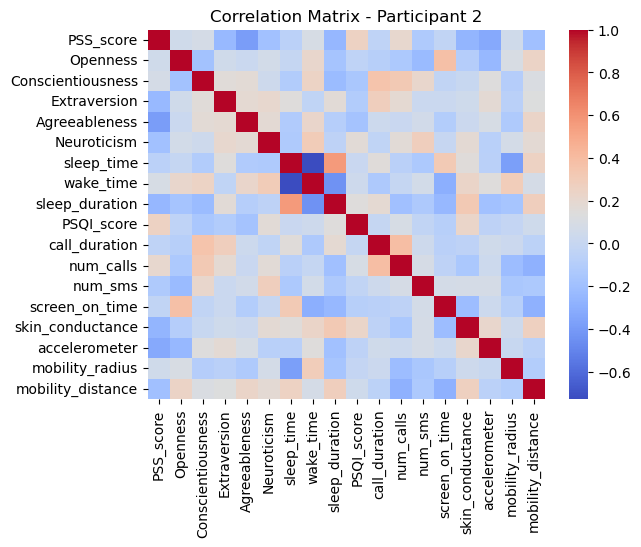

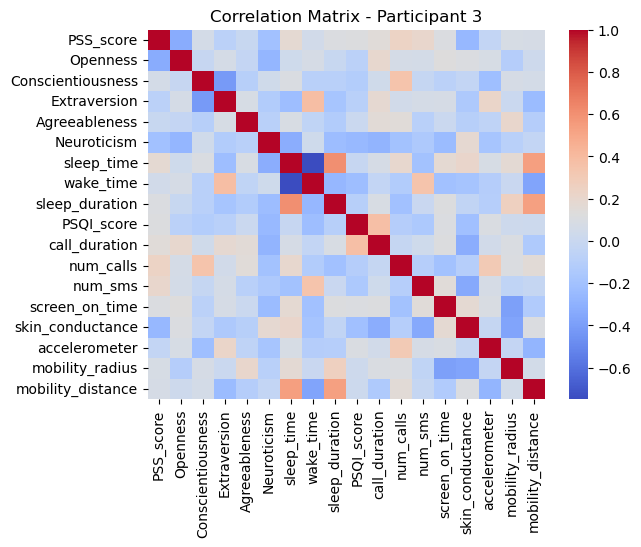

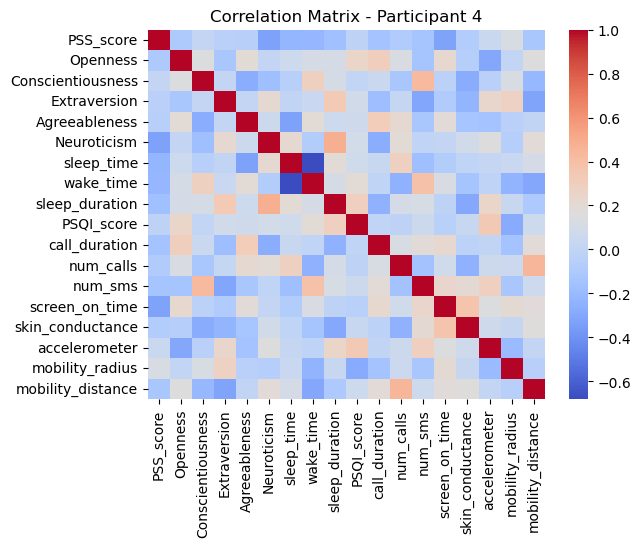

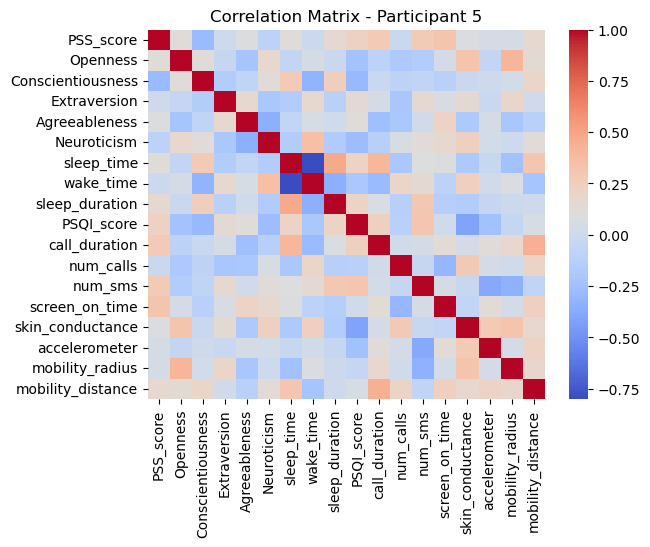

...

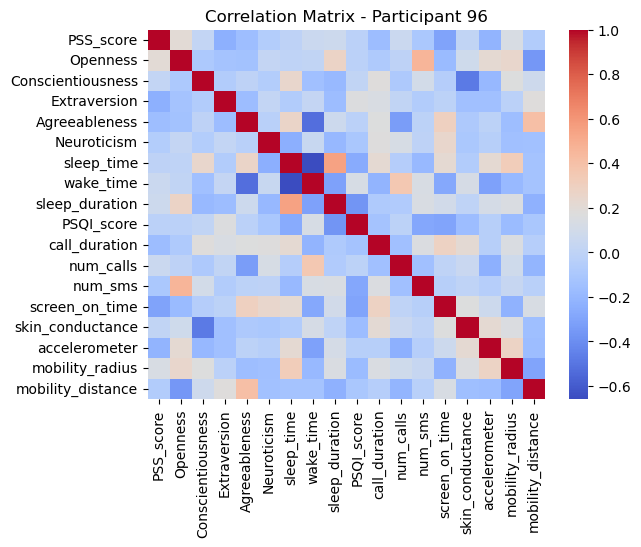

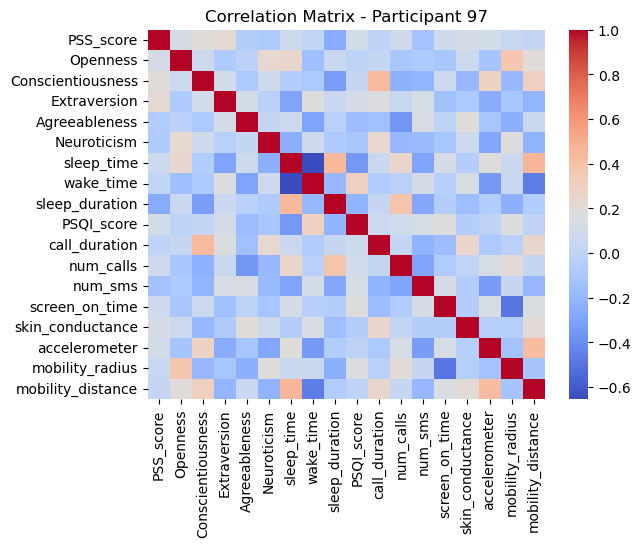

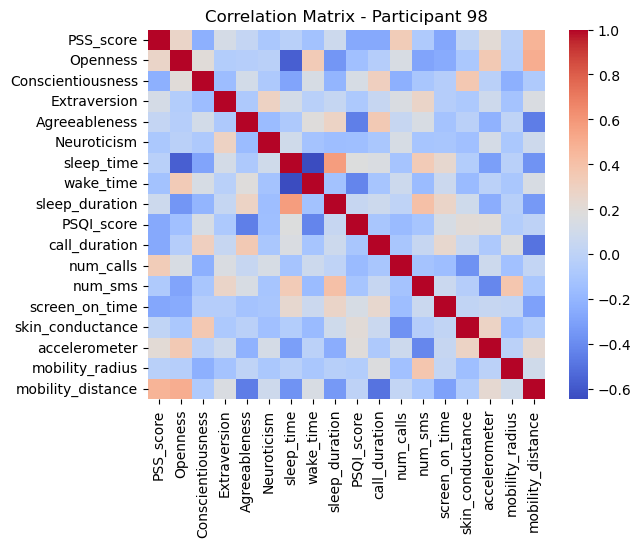

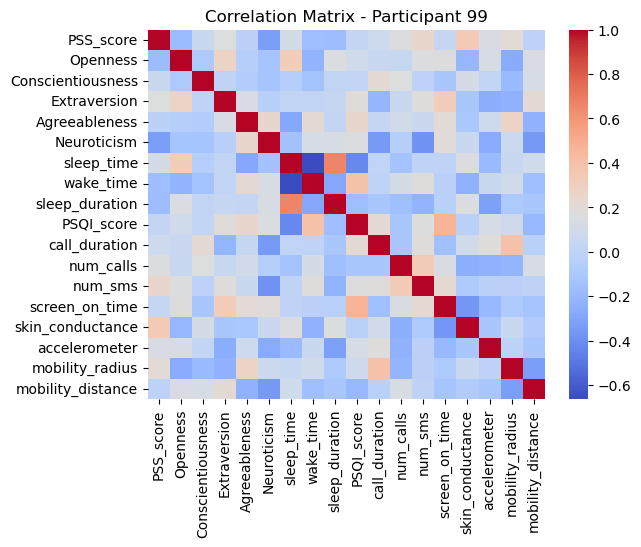

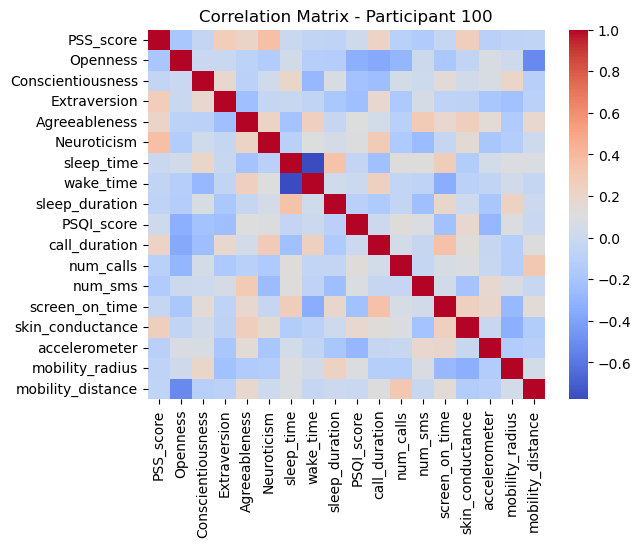

In [33]:
#2. Group-Based Correlation Analysis
participants = df['participant_id'].unique()
for participant in participants:
    participant_data = df[df['participant_id'] == participant].drop(columns=['participant_id', 'day'])
    corr_matrix = participant_data.corr()
    sns.heatmap(corr_matrix, cmap='coolwarm', annot=False)
    plt.title(f"Correlation Matrix - Participant {participant}")
    plt.show()

# Outcome of Initial Correlation Analysis
- Features are weakly correlated among each other, as well as with the lablel
- Within each participant separately the correlaions are stronger, however inconsistent if different participants are compared among each other

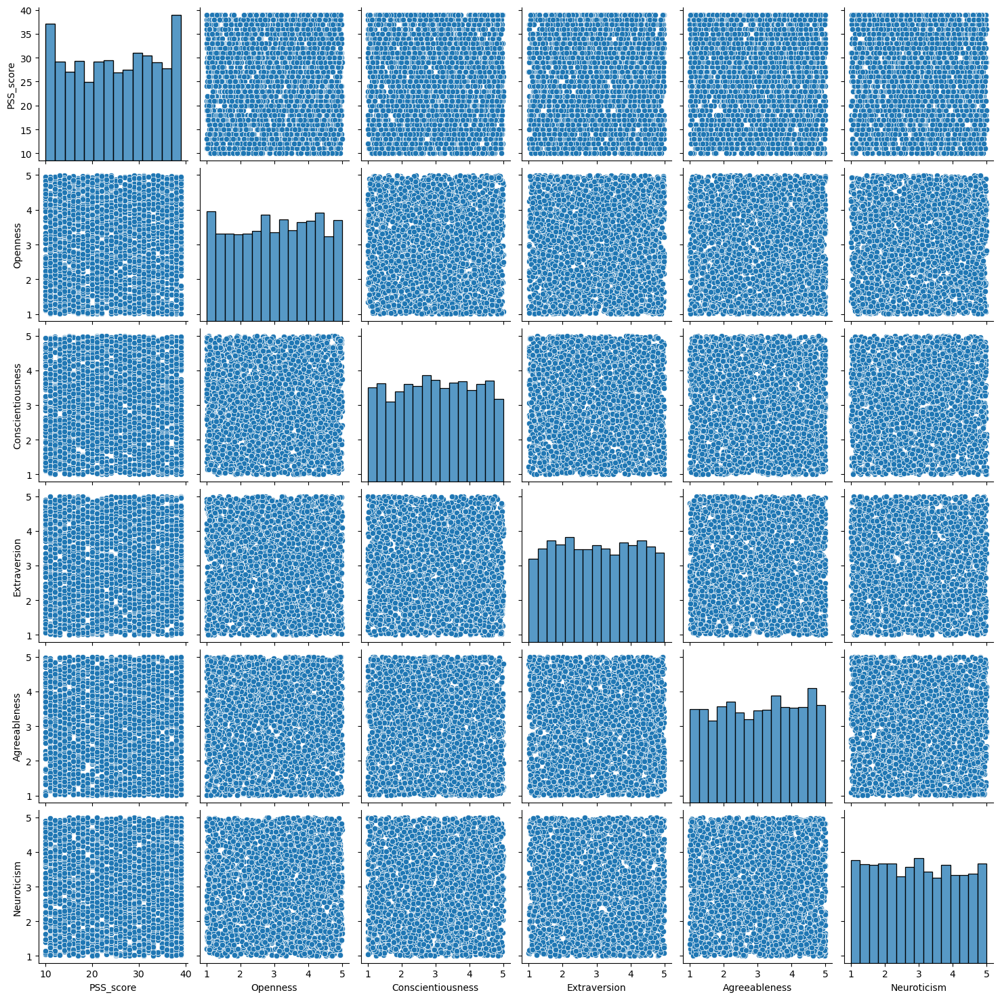

In [41]:
# Visualize Relationships with different types of attributes

#1. Plotting PSS_score with Psycological attributes: Openness, Conscientiousness, Extraversion, Agreeableness, Neuroticism
sns.pairplot(df, vars=['PSS_score', 'Openness', 'Conscientiousness', 'Extraversion', 'Agreeableness', 'Neuroticism'])
plt.show()

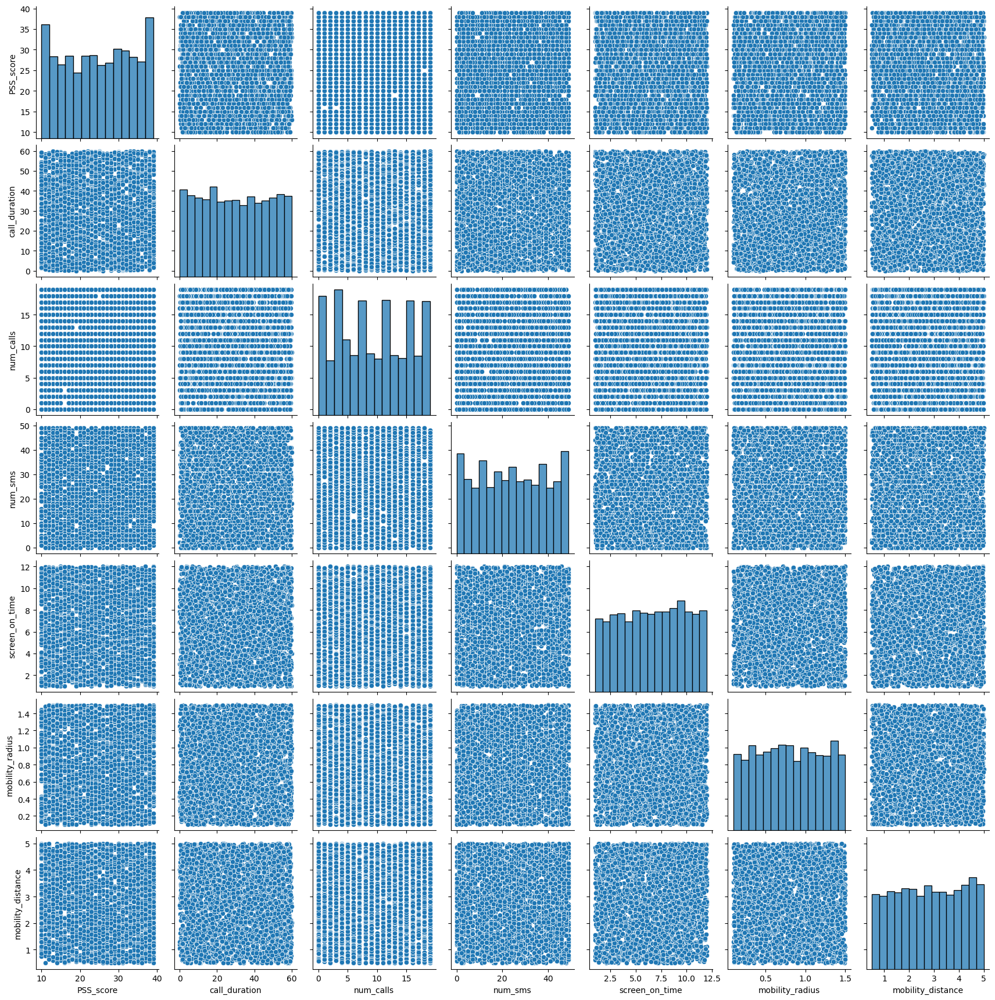

In [47]:
#2. Plotting PSS_score with Behavioral attributes: call_duration, num_calls, num_sms, screen_on_time, mobility_radius, mobility_distance
sns.pairplot(df, vars=['PSS_score', 'call_duration', 'num_calls', 'num_sms', 'screen_on_time', 'mobility_radius', 'mobility_distance'])
plt.show()

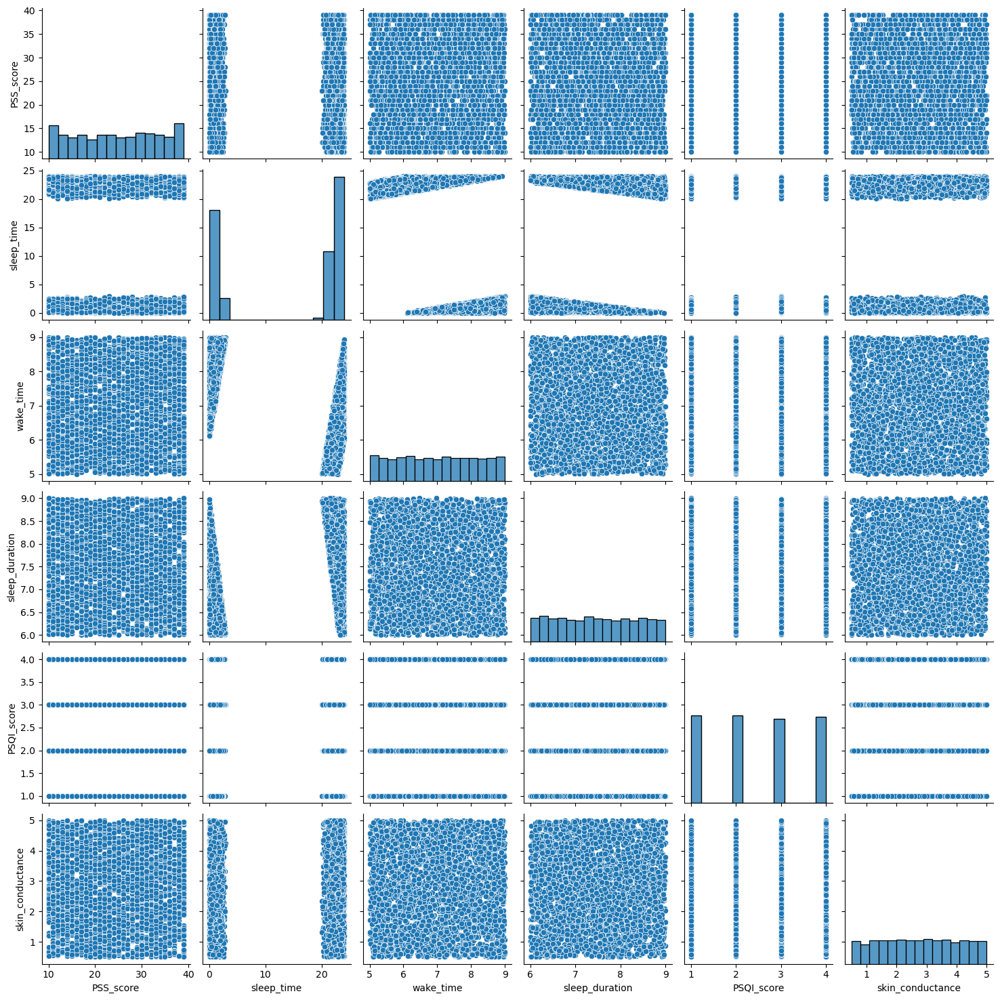

In [49]:
#3. Plotting PSS_score with Physiological attributes: sleep_time, wake_time, sleep_duration, PSQI_score, skin_conductance
sns.pairplot(df, vars=['PSS_score', 'sleep_time', 'wake_time', 'sleep_duration', 'PSQI_score', 'skin_conductance'])
plt.show()

SUMMARY: no meaniingfull relations of attributes with label were identtified after data visualisation